In [ ]:
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from scipy import stats
import missingno as msno
from sklearn.impute import SimpleImputer, KNNImputer
import warnings
warnings.filterwarnings("ignore")
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
#from sklearn.metrics import scorer
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
#!pip install --upgrade scikit-learn
import sklearn

In [ ]:
# Load and preprocess data
data1 = pd.read_csv(r"/content/drive/MyDrive/data_cleaned.csv", sep='\t',encoding='utf-8',header=0)
data1.head()

,Unnamed: 0,date,serial_number,model,capacity_bytes,failure,smart_1_normalized,smart_1_raw,smart_2_normalized,smart_2_raw,...,smart_250_normalized,smart_250_raw,smart_251_normalized,smart_251_raw,smart_252_normalized,smart_252_raw,smart_254_normalized,smart_254_raw,smart_255_normalized,smart_255_raw
0,0,2022-03-20,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,1,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2022-03-17,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2022-03-18,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,2022-03-08,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,2022-03-19,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Create Target Window

In [ ]:
import pandas as pd

def process_data(df):
    """
    Processes the provided dataframe to extract both failure and non-failure-related information.

    Args:
    - df (pandas.DataFrame): The main input dataframe.

    Returns:
    - final_df (pandas.DataFrame): Processed dataframe with information about failures and non-failures.
    """

    # Extract rows where FAILURE is indicated and generate df_failure_list
    failed_entries = df[df.failure == 1].copy()
    failed_entries['rank_by_date'] = failed_entries.groupby('serial_number')['date'].rank(method='first')
    first_failures = failed_entries[failed_entries['rank_by_date'] == 1][['serial_number', 'date']]
    first_failures = first_failures.rename(columns={"date": "FAILURE_DATE"})
    df_failure_list = first_failures.copy()
    df_failure_list['wookie'] = 1



    # Merge the FAILURE_DATE back to the main dataframe
    df = df.merge(first_failures, on='serial_number', how='left')

    # Convert to datetime
    df['FAILURE_DATE'] = pd.to_datetime(df['FAILURE_DATE'])
    df['date'] = pd.to_datetime(df['date'])

    # FAILURE DATA: Calculate days to failure and assign target labels
    df['days_to_failure'] = (df['FAILURE_DATE'] - df['date']).dt.days
    df['TARGET'] = df['days_to_failure'].apply(lambda x: 1 if x <= 10 else 0).fillna(0).astype(int)


    # NON-FAILURE DATA: For the entries where there's no failure, set appropriate defaults
    df['FAILURE_DATE'] = df['FAILURE_DATE'].fillna("2099-12-12")  # Assuming a future date to indicate no failure

    # Drop intermediate columns used for calculations
    final_df = df.drop(columns=['wookie', 'rank_by_date', 'days_to_failure'], errors='ignore')

    # Aggregation
    aggregation = final_df.groupby('TARGET').size().reset_index(name='count')
    print(aggregation)

    return final_df

# Usage:
# Ensure df is a valid pandas DataFrame with the necessary columns.
final_df = process_data(data1)
final_df.head(1000)


   TARGET   count
0       0  159970
1       1    8315


,Unnamed: 0,date,serial_number,model,capacity_bytes,failure,smart_1_normalized,smart_1_raw,smart_2_normalized,smart_2_raw,...,smart_251_normalized,smart_251_raw,smart_252_normalized,smart_252_raw,smart_254_normalized,smart_254_raw,smart_255_normalized,smart_255_raw,FAILURE_DATE,TARGET
0,0,2022-03-20,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,1,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-20,1
1,1,2022-03-17,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-20,1
2,2,2022-03-18,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-20,1
3,3,2022-03-08,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-20,0
4,4,2022-03-19,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-20,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,995,2022-01-05,ZA17ZNLA,ST8000NM0055,8001563222016,0,81.0,138014856.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-02-03,0
996,996,2022-01-22,ZA17ZNLA,ST8000NM0055,8001563222016,0,80.0,89765784.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-02-03,0
997,997,2022-01-06,ZA17ZNLA,ST8000NM0055,8001563222016,0,76.0,44376920.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-02-03,0
998,998,2022-01-15,ZA17ZNLA,ST8000NM0055,8001563222016,0,82.0,144918272.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-02-03,0


In [ ]:
## Data Splitting

In [ ]:
#Since this a time series data, random data splitting is not possible which is why splitting is based on serial number for this dataset



# Selecting a subset of columns
df_sample = final_df[['serial_number']]

# Removing duplicates
df_sample = df_sample.drop_duplicates(subset=['serial_number'])

# Adding a column with random values
df_sample['random'] = np.random.rand(len(df_sample))

In [ ]:
#Assigning randomly the data based on serial number

conditions = [
    (df_sample['random'] <= 0.33333333),
    (df_sample['random'] >= 0.6666666667)
]

choices = ['TRAINING', 'TESTING']

df_sample['GROUP'] = np.select(conditions, choices, default='VALIDATION')

In [ ]:
# Drop the 'random' column
df_sample = df_sample.drop(columns=['random'])

# Perform merge
df = pd.merge(final_df, df_sample, on='serial_number')

In [ ]:
df.head()

,Unnamed: 0,date,serial_number,model,capacity_bytes,failure,smart_1_normalized,smart_1_raw,smart_2_normalized,smart_2_raw,...,smart_251_raw,smart_252_normalized,smart_252_raw,smart_254_normalized,smart_254_raw,smart_255_normalized,smart_255_raw,FAILURE_DATE,TARGET,GROUP
0,0,2022-03-20,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,1,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-20,1,TESTING
1,1,2022-03-17,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-20,1,TESTING
2,2,2022-03-18,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-20,1,TESTING
3,3,2022-03-08,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-20,0,TESTING
4,4,2022-03-19,11W0A06FF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-03-20,1,TESTING


In [ ]:
# Filter rows for TRAINING set
training_data = df[df['GROUP'] == "TRAINING"]

# Filter rows for Test set
test_data = df[df['GROUP'] == "TESTING"]

# Filter rows for Validation set
validation_data = df[df['GROUP'] == "VALIDATION"]

In [ ]:
train_indices = training_data.index
test_indices = test_data.index
valid_indices = validation_data.index


In [ ]:
# X_train contains all columns excluding target and non-predictive columns
X_train = training_data.drop(columns=['TARGET',  'GROUP', 'FAILURE_DATE','date','model','capacity_bytes','failure','Unnamed: 0'])  # Add any other non-predictive columns as needed

# y_train contains only the TARGET column
y_train = training_data['TARGET']


# X_test contains all columns excluding target and non-predictive columns
X_test = test_data.drop(columns=['TARGET', 'GROUP', 'FAILURE_DATE','date','model','capacity_bytes','failure','Unnamed: 0'])  # Add any other non-predictive columns as needed

# y_test contains only the TARGET column
y_test = test_data['TARGET']


# X_valid contains all columns excluding target and non-predictive columns
X_valid = validation_data.drop(columns=['TARGET', 'GROUP', 'FAILURE_DATE','date','model','capacity_bytes','failure','Unnamed: 0'])  # Add any other non-predictive columns as needed

# y_valid contains only the TARGET column
y_valid = validation_data['TARGET']

In [ ]:
#Dimensionality reduction
#step1:remove raw smart attribute
#step2:remove features with zero variance
#step3:removes attributes where 50percent of values are missing

In [ ]:
#remove raw smart attribute

In [ ]:
filter_col = [col for col in data1 if col.endswith('_raw')]
len(filter_col)

87

In [ ]:
#After removing columns with '_raw ' ,new dataframe is df


x_train_n = X_train.drop(columns= filter_col)

In [ ]:
#remove features with 50üercent values missing

 
Count total NaN in a DataFrame :  21727954


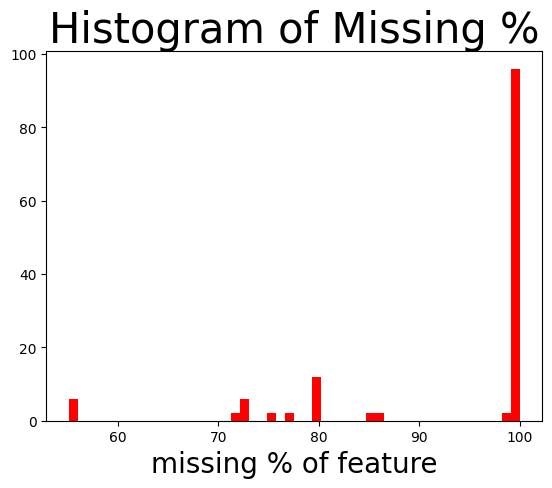

In [ ]:
#Percentage of missing values
# Count total NaN in a DataFrame
print(" \nCount total NaN in a DataFrame : ",df.isnull().sum().sum())

#total number of columns with missing values
sum(df.apply(lambda x: sum(x.isnull().values),axis=0)>0)


percent = pd.DataFrame({'Missing Percentage %':(df.isnull().sum() * 100 / len(df)).round(4).sort_values(ascending=False)})
percent
above_ff = percent[percent['Missing Percentage %'] > 55]
above_ff
above_ff.shape


#matplot histplot for missing percentage of feature

plt.hist(above_ff,50,facecolor='r')
plt.xlabel('missing % of feature',fontsize=20)
plt.title('Histogram of Missing %',fontsize=30)
plt.show()

 
Count total NaN in a DataFrame :  3499037


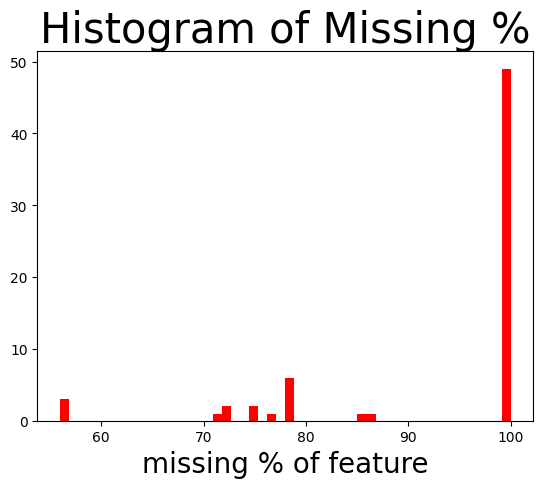

In [ ]:
#Percentage of missing values
# Count total NaN in a DataFrame
print(" \nCount total NaN in a DataFrame : ",x_train_n.isnull().sum().sum())

#total number of columns with missing values
sum(df.apply(lambda x: sum(x.isnull().values),axis=0)>0)


percent = pd.DataFrame({'Missing Percentage %':(x_train_n.isnull().sum() * 100 / len(x_train_n)).round(4).sort_values(ascending=False)})
percent
above_ff = percent[percent['Missing Percentage %'] > 55]
above_ff
above_ff.shape


#matplot histplot for missing percentage of feature

plt.hist(above_ff,50,facecolor='r')
plt.xlabel('missing % of feature',fontsize=20)
plt.title('Histogram of Missing %',fontsize=30)
plt.show()

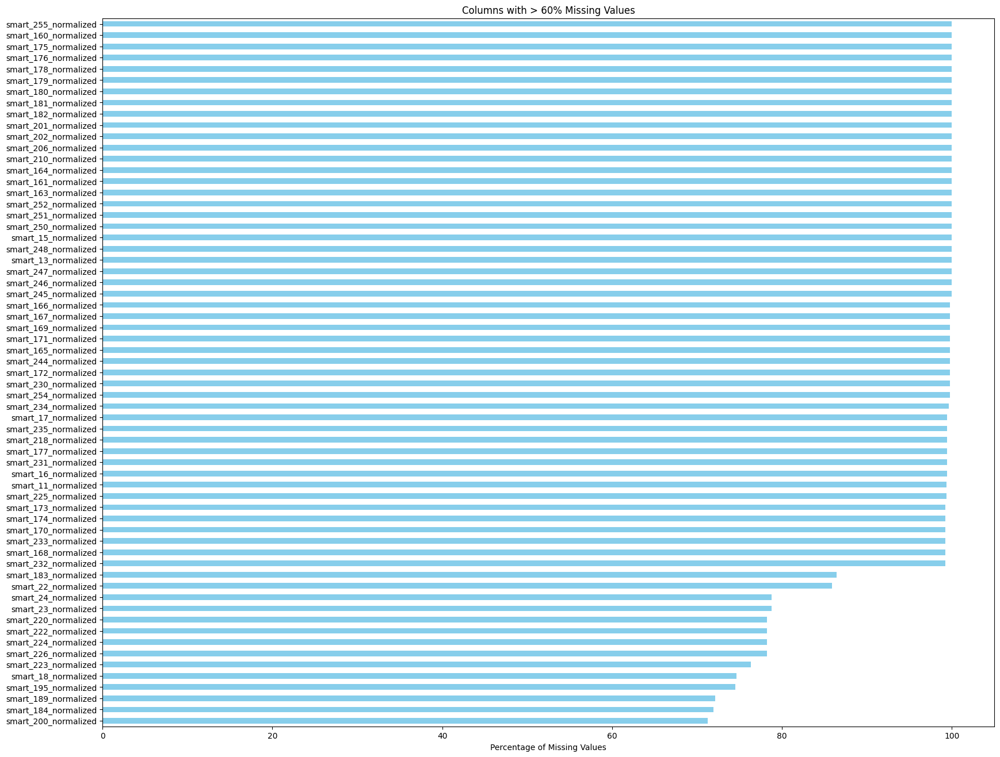

In [ ]:


missing_percent = (x_train_n.isnull().sum() / len(x_train_n)) * 100
high_missing = missing_percent[missing_percent > 60]
high_missing.sort_values(ascending=True).plot(kind='barh', figsize=(20, 16), color='skyblue')
plt.xlabel('Percentage of Missing Values')
plt.title('Columns with > 60% Missing Values')
plt.show()


<Axes: >

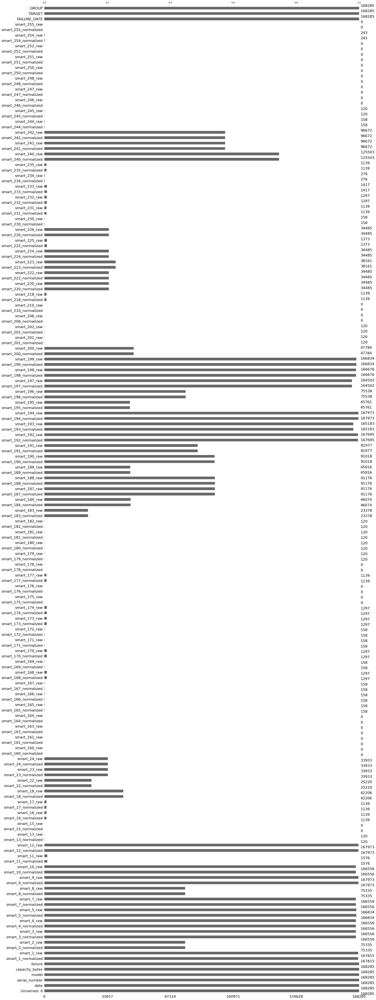

In [ ]:
#bargraph represnts columns with missing values
#


msno.bar(df)

<Axes: >

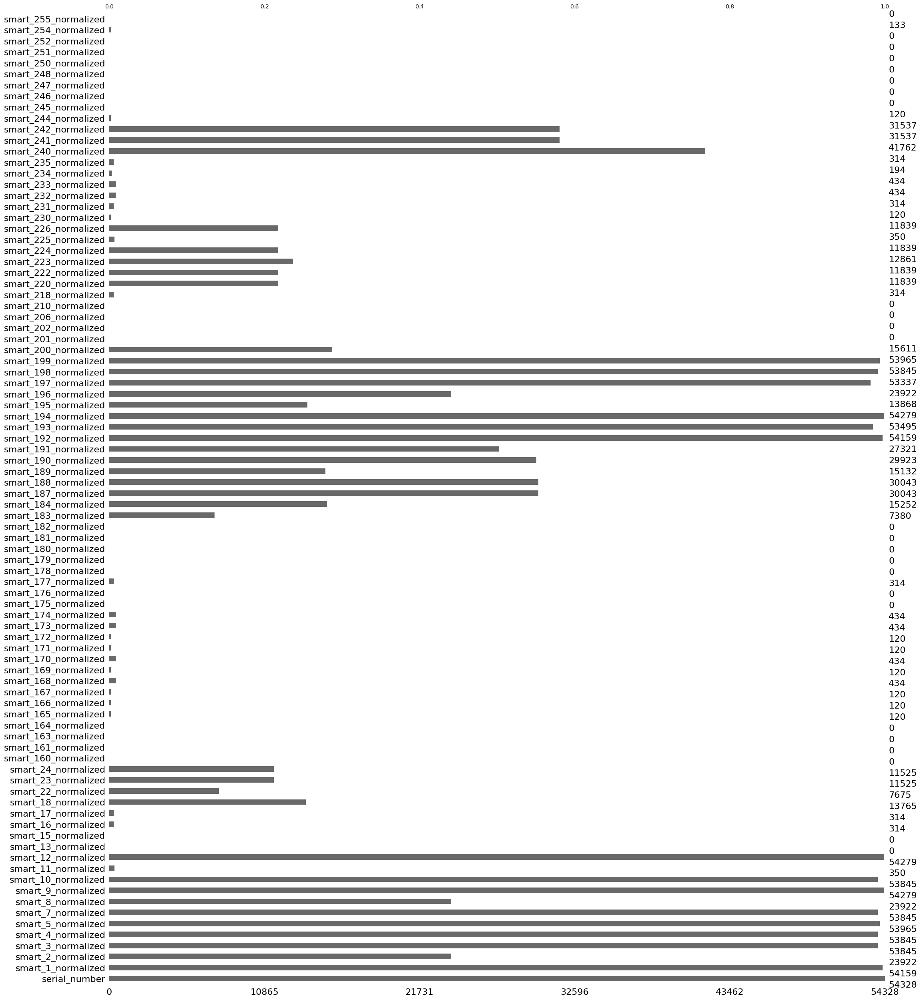

In [ ]:
import missingno as msno
msno.bar(x_train_n)

In [ ]:
#REMOVING FEATURES HAVING MISSING VALUE RATIO MORE THAN 60%.

def percentna(dataframe, threshold):
    columns = dataframe.columns[(dataframe.isnull().sum()/len(dataframe))>threshold]
    return columns.tolist()
na_columns = percentna(x_train_n, 0.6)
len(na_columns)


63

In [ ]:
x_train_dn = x_train_n.drop(na_columns, axis=1)
x_train_dn.shape

(54328, 25)

In [ ]:
x_train_dn.head()

,serial_number,smart_1_normalized,smart_2_normalized,smart_3_normalized,smart_4_normalized,smart_5_normalized,smart_7_normalized,smart_8_normalized,smart_9_normalized,smart_10_normalized,...,smart_192_normalized,smart_193_normalized,smart_194_normalized,smart_196_normalized,smart_197_normalized,smart_198_normalized,smart_199_normalized,smart_240_normalized,smart_241_normalized,smart_242_normalized
79,2AGMPK0Y,62.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,100.0,187.0,100.0,100.0,100.0,200.0,NaN,NaN,NaN
80,2AGMPK0Y,59.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,100.0,187.0,100.0,100.0,100.0,200.0,NaN,NaN,NaN
81,2AGMPK0Y,70.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,100.0,187.0,100.0,100.0,100.0,200.0,NaN,NaN,NaN
82,2AGMPK0Y,68.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,100.0,187.0,100.0,100.0,100.0,200.0,NaN,NaN,NaN
83,2AGMPK0Y,71.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,100.0,187.0,100.0,100.0,100.0,200.0,NaN,NaN,NaN


In [ ]:
#remove zero variance features

smart_13_normalized     0.0
smart_13_raw            0.0
smart_16_normalized     0.0
smart_17_normalized     0.0
smart_18_normalized     0.0
smart_18_raw            0.0
smart_23_normalized     0.0
smart_23_raw            0.0
smart_24_raw            0.0
smart_165_normalized    0.0
smart_166_normalized    0.0
smart_167_normalized    0.0
smart_168_normalized    0.0
smart_169_normalized    0.0
smart_170_normalized    0.0
smart_171_normalized    0.0
smart_171_raw           0.0
smart_172_normalized    0.0
smart_172_raw           0.0
smart_173_normalized    0.0
smart_174_normalized    0.0
smart_179_normalized    0.0
smart_179_raw           0.0
smart_180_normalized    0.0
smart_180_raw           0.0
smart_181_normalized    0.0
smart_181_raw           0.0
smart_182_normalized    0.0
smart_182_raw           0.0
smart_200_normalized    0.0
smart_201_normalized    0.0
smart_201_raw           0.0
smart_202_raw           0.0
smart_218_normalized    0.0
smart_220_normalized    0.0
smart_224_normalized

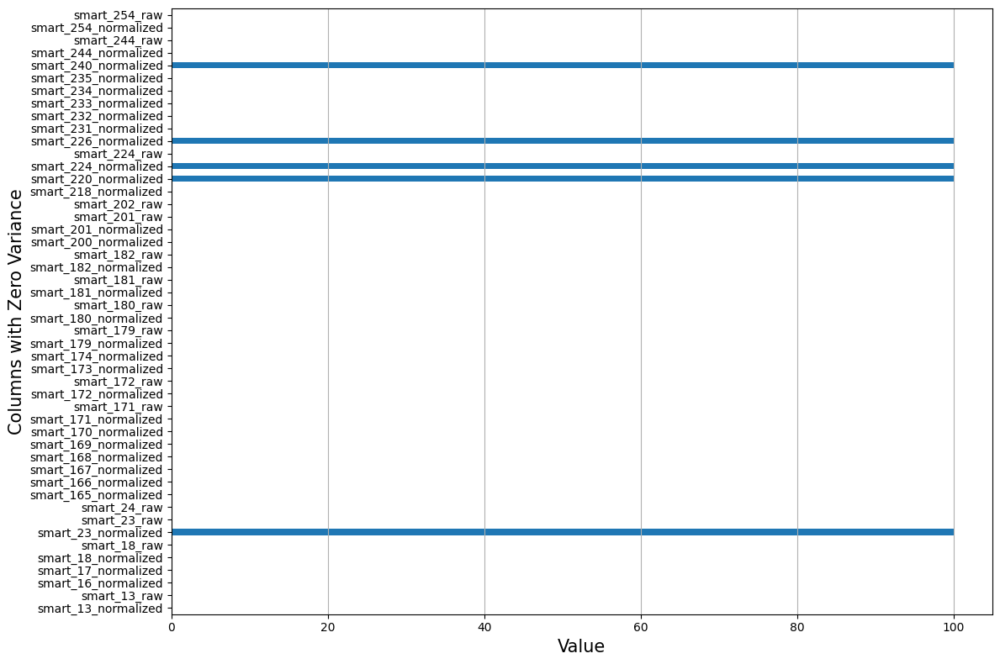

In [ ]:
# Calculate the variance for each column
variances = df.var()

# Filter out columns with zero variance
zero_variance_cols = variances[variances == 0]
print(zero_variance_cols)
# Count of columns with zero variance
count_zero_variance = len(zero_variance_cols)
# If you want to visualize the actual values (which will be the same for each column), you can do:
zero_variance_values = df[zero_variance_cols.index].iloc[0]  # Fetch the first row as a representation

# Plot
plt.figure(figsize=(12, 8))
zero_variance_values.plot(kind='barh')
plt.xlabel('Value', fontsize=15)
plt.ylabel('Columns with Zero Variance', fontsize=15)
#plt.title('Columns with Zero Variance', fontsize=20)
plt.grid(axis='x')
plt.tight_layout()
plt.show()

smart_4_normalized      0.0
smart_12_normalized     0.0
smart_240_normalized    0.0
dtype: float64


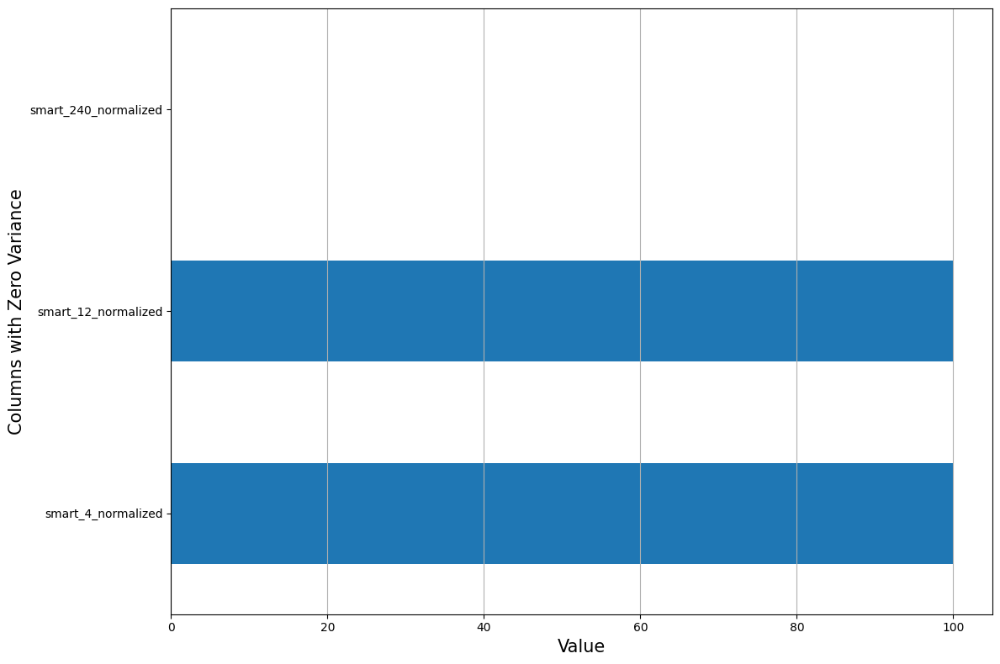

In [ ]:
# Calculate the variance for each column
variances = x_train_dn.var()

# Filter out columns with zero variance
zero_variance_cols = variances[variances == 0]
print(zero_variance_cols)
# Count of columns with zero variance
count_zero_variance = len(zero_variance_cols)
# If you want to visualize the actual values (which will be the same for each column), you can do:
zero_variance_values = x_train_dn[zero_variance_cols.index].iloc[0]  # Fetch the first row as a representation

# Plot
plt.figure(figsize=(12, 8))
zero_variance_values.plot(kind='barh')
plt.xlabel('Value', fontsize=15)
plt.ylabel('Columns with Zero Variance', fontsize=15)
#plt.title('Columns with Zero Variance', fontsize=20)
plt.grid(axis='x')
plt.tight_layout()
plt.show()

In [ ]:
print(zero_variance_cols)

smart_4_normalized      0.0
smart_12_normalized     0.0
smart_240_normalized    0.0
dtype: float64


In [ ]:
x_train_lv = x_train_dn.drop(['smart_241_normalized','smart_240_normalized','smart_242_normalized'],  axis=1)

In [ ]:
#REMOVING COLUMNS WITH UNIQUE VALUES(Low Variance)



#from sklearn.feature_selection import VarianceThreshold
#var_thres=VarianceThreshold(threshold=0)
#var_thres.fit(x_train_dn)
#constant_columns = [column for column in x_train_dn.columns
 #                   if column not in x_train_dn.columns[var_thres.get_support()]]
#print(len(constant_columns))
#x_train_lv = x_train_dn.drop(zero_variance_cols,axis=1)

In [ ]:
x_train_lv.head()

,serial_number,smart_1_normalized,smart_2_normalized,smart_3_normalized,smart_4_normalized,smart_5_normalized,smart_7_normalized,smart_8_normalized,smart_9_normalized,smart_10_normalized,...,smart_188_normalized,smart_190_normalized,smart_191_normalized,smart_192_normalized,smart_193_normalized,smart_194_normalized,smart_196_normalized,smart_197_normalized,smart_198_normalized,smart_199_normalized
79,2AGMPK0Y,62.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,100.0,100.0,187.0,100.0,100.0,100.0,200.0
80,2AGMPK0Y,59.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,100.0,100.0,187.0,100.0,100.0,100.0,200.0
81,2AGMPK0Y,70.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,100.0,100.0,187.0,100.0,100.0,100.0,200.0
82,2AGMPK0Y,68.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,100.0,100.0,187.0,100.0,100.0,100.0,200.0
83,2AGMPK0Y,71.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,100.0,100.0,187.0,100.0,100.0,100.0,200.0


In [ ]:
#Dropping the Columns in test dataset also .
#In order to match the shape of x_train and x_test for further analysis.

x_test_drop = X_test.copy()
x_test_drop = x_test_drop.drop(columns= filter_col,axis =1)
x_test_drop = x_test_drop.drop(na_columns, axis=1)
x_test_drop = x_test_drop.drop(['smart_240_normalized','smart_241_normalized','smart_242_normalized'],  axis=1)

#Dropping the Columns in validation dataset also .
#In order to match the shape of x_train and x_test for further analysis.

x_valid_drop = X_valid.copy()
x_valid_drop = x_valid_drop.drop(columns= filter_col,axis =1)
x_valid_drop = x_valid_drop.drop(na_columns, axis=1)
x_valid_drop = x_valid_drop.drop(['smart_240_normalized','smart_241_normalized','smart_242_normalized'],  axis=1)

In [ ]:
#Outlier Analysis

Unnamed: 0                 Axes(0.125,0.874645;0.133621x0.00535466)
capacity_bytes          Axes(0.285345,0.874645;0.133621x0.00535466)
failure                  Axes(0.44569,0.874645;0.133621x0.00535466)
smart_1_normalized      Axes(0.606034,0.874645;0.133621x0.00535466)
smart_1_raw             Axes(0.766379,0.874645;0.133621x0.00535466)
                                           ...                     
smart_254_normalized    Axes(0.606034,0.656175;0.133621x0.00535466)
smart_254_raw           Axes(0.766379,0.656175;0.133621x0.00535466)
smart_255_normalized        Axes(0.125,0.64975;0.133621x0.00535466)
smart_255_raw            Axes(0.285345,0.64975;0.133621x0.00535466)
TARGET                    Axes(0.44569,0.64975;0.133621x0.00535466)
Length: 178, dtype: object

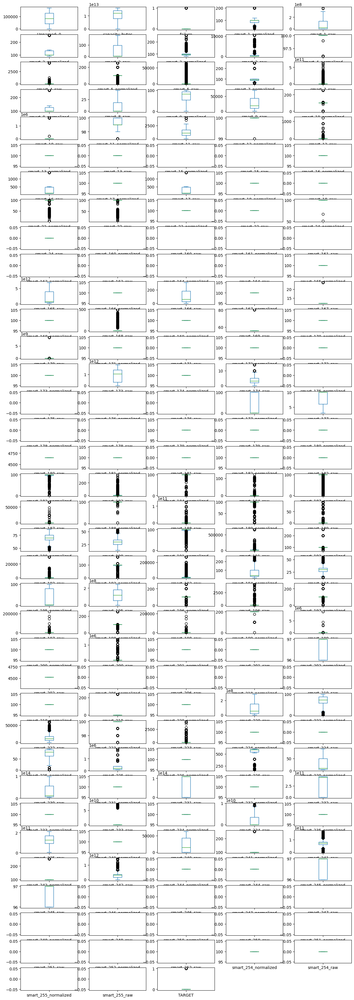

In [ ]:
df.plot(kind='box', subplots=True,layout=(120,5), fontsize=10, figsize=(15,150))

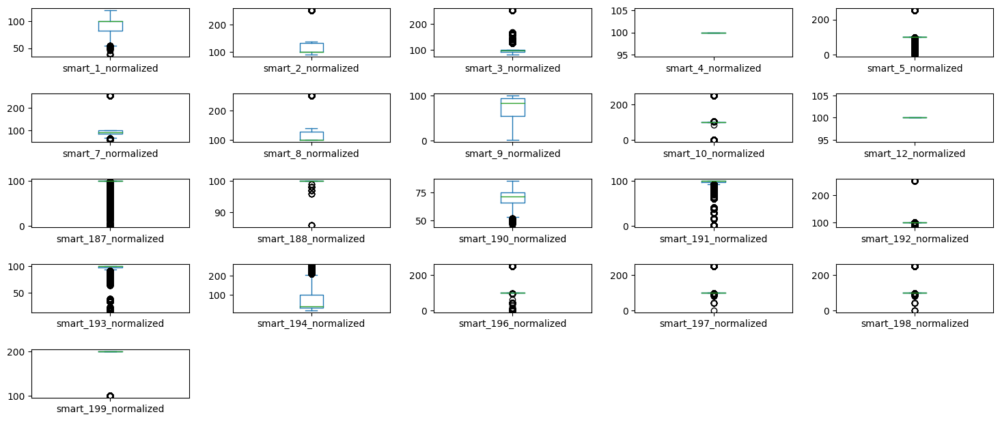

In [ ]:
x_train_lv.plot(kind='box', subplots=True,layout=(120,5), fontsize=10, figsize=(15,150))
plt.tight_layout(pad=2.0)

In [ ]:
#OUTLIER IMPUTATION using 3s rule

def outliers(feat):
 upper_limit = feat.mean() + 3*feat.std()
 lower_limit = feat.mean() - 3*feat.std()

 feat = np.where(
    feat >upper_limit,
    upper_limit,
    np.where(
       feat <lower_limit,
        lower_limit,
        feat ))
 return feat
# Only select numerical columns
numerical_columns = x_train_lv.select_dtypes(include=[np.number]).columns.tolist()

x_train_outliers_imputation = x_train_lv.copy()
for column in numerical_columns:
    x_train_outliers_imputation[column] = outliers(x_train_outliers_imputation[column])
#x_train_outliers_imputation =x_train_lv.copy()
#for column in x_train_outliers_imputation:
 # x_train_outliers_imputation[column] = outliers(x_train_outliers_imputation[column])

In [ ]:
x_train_outliers_imputation.head()

,serial_number,smart_1_normalized,smart_2_normalized,smart_3_normalized,smart_4_normalized,smart_5_normalized,smart_7_normalized,smart_8_normalized,smart_9_normalized,smart_10_normalized,...,smart_188_normalized,smart_190_normalized,smart_191_normalized,smart_192_normalized,smart_193_normalized,smart_194_normalized,smart_196_normalized,smart_197_normalized,smart_198_normalized,smart_199_normalized
79,2AGMPK0Y,62.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,100.0,100.0,187.0,100.0,100.0,100.0,200.0
80,2AGMPK0Y,59.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,100.0,100.0,187.0,100.0,100.0,100.0,200.0
81,2AGMPK0Y,70.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,100.0,100.0,187.0,100.0,100.0,100.0,200.0
82,2AGMPK0Y,68.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,100.0,100.0,187.0,100.0,100.0,100.0,200.0
83,2AGMPK0Y,71.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,100.0,100.0,187.0,100.0,100.0,100.0,200.0


In [ ]:
#MISSING VALUE IMPUTATION

#Using KNN Imputation Method

numColumns = x_train_outliers_imputation.select_dtypes(include=np.number).columns.tolist();
# initialize imputer
imputer = KNNImputer(n_neighbors = 1,weights='uniform')
# fit the imputer on X_train. pass only numeric columns.
imputer.fit(x_train_outliers_imputation[numColumns])
# transform the data using the fitted imputer
X_train_knn_impute1 = imputer.transform(x_train_outliers_imputation[numColumns])
X_test_knn_impute1 = imputer.transform(X_test[numColumns])
# put the output into DataFrame. remember to pass columns used in fit/transform

X_train_knn_impute1 = pd.DataFrame(X_train_knn_impute1, columns=numColumns)
X_test_knn_impute1 = pd.DataFrame(X_test_knn_impute1, columns=numColumns)

# For the training set
non_num_train = x_train_outliers_imputation.drop(columns=numColumns)  # Drop numerical columns, keep non-numerical
X_train_knn_impute = pd.concat([non_num_train.reset_index(drop=True),
                                         X_train_knn_impute1.reset_index(drop=True)], axis=1)

# For the test set
non_num_test = X_test.drop(columns=numColumns)  # Drop numerical columns, keep non-numerical
X_test_knn_impute = pd.concat([non_num_test.reset_index(drop=True),
                                        X_test_knn_impute1.reset_index(drop=True)], axis=1)


In [ ]:
X_train_knn_impute.head()

,serial_number,smart_1_normalized,smart_2_normalized,smart_3_normalized,smart_4_normalized,smart_5_normalized,smart_7_normalized,smart_8_normalized,smart_9_normalized,smart_10_normalized,...,smart_188_normalized,smart_190_normalized,smart_191_normalized,smart_192_normalized,smart_193_normalized,smart_194_normalized,smart_196_normalized,smart_197_normalized,smart_198_normalized,smart_199_normalized
0,2AGMPK0Y,62.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,52.0,100.0,100.0,100.0,187.0,100.0,100.0,100.0,200.0
1,2AGMPK0Y,59.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,52.0,100.0,100.0,100.0,187.0,100.0,100.0,100.0,200.0
2,2AGMPK0Y,70.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,51.0,100.0,100.0,100.0,187.0,100.0,100.0,100.0,200.0
3,2AGMPK0Y,68.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,51.0,100.0,100.0,100.0,187.0,100.0,100.0,100.0,200.0
4,2AGMPK0Y,71.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,51.0,100.0,100.0,100.0,187.0,100.0,100.0,100.0,200.0


In [ ]:
X_valid_knn_impute1 = imputer.transform(X_valid[numColumns])
X_valid_knn_impute1 = pd.DataFrame(X_valid_knn_impute1, columns=numColumns)

# For the training set
non_num_valid = X_valid.drop(columns=numColumns)  # Drop numerical columns, keep non-numerical
X_valid_knn_impute = pd.concat([non_num_valid.reset_index(drop=True),
                                         X_valid_knn_impute1.reset_index(drop=True)], axis=1)




<Axes: >

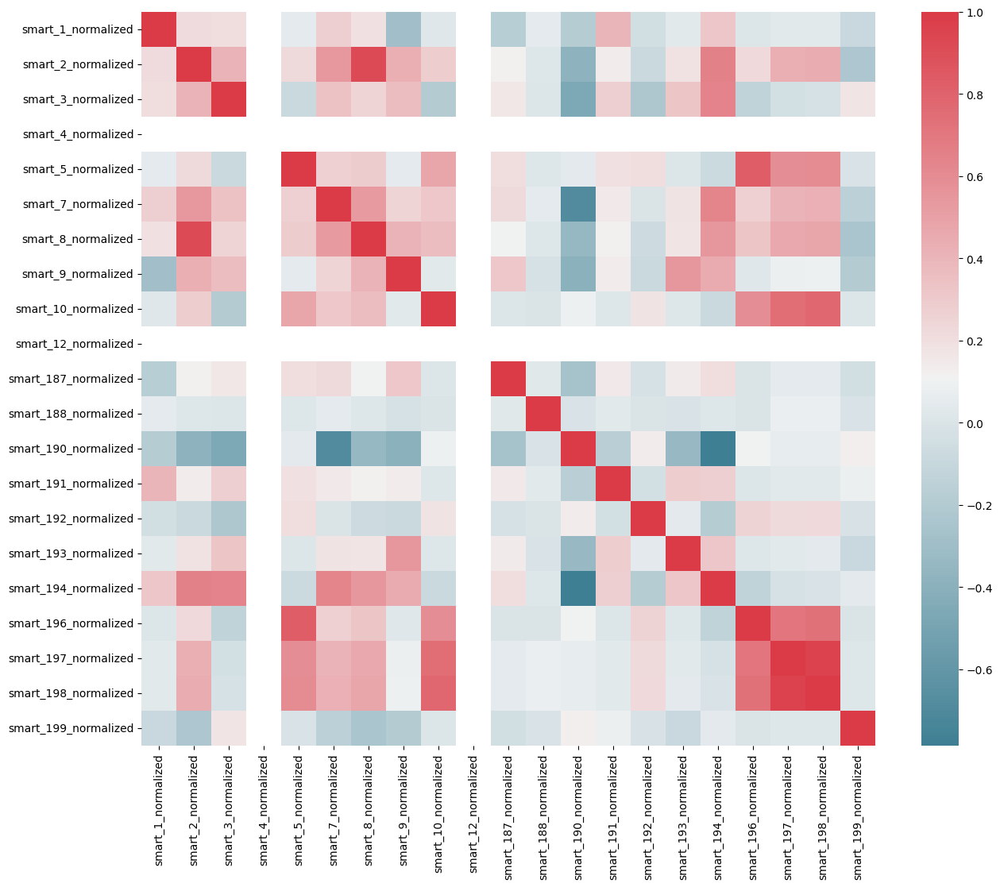

In [ ]:
# Correlation
f, ax = plt.subplots(figsize=(15, 12))
corr = X_train_knn_impute1.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool),
            cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)

In [ ]:
#Check Correlation
def feature_corr(df, threshold):

    corr = pd.DataFrame(abs(df.corr()))

    Featurei = []
    Featurej = []
    Corr = []

    for i in corr.index:
        for j in corr.columns:
            if (corr.loc[i, j] > threshold and i != j):
                if(i not in Featurei):
                    Featurei.append(i)
                if(j not in Featurej):
                    Featurej.append(j)
                    Corr.append(corr.loc[i, j])

    d = pd.DataFrame([Featurei, Featurej, Corr]).transpose()
    display(d)
    highly_correlated = set(d[0])

    print('Number of features = ', len(highly_correlated))

In [ ]:
corr_data = feature_corr(X_train_knn_impute1,0.0)

,0,1,2
0,smart_1_normalized,smart_2_normalized,0.213415
1,smart_2_normalized,smart_3_normalized,0.205104
2,smart_3_normalized,smart_5_normalized,0.048433
3,smart_5_normalized,smart_7_normalized,0.275978
4,smart_7_normalized,smart_8_normalized,0.194244
5,smart_8_normalized,smart_9_normalized,0.284561
6,smart_9_normalized,smart_10_normalized,0.01762
7,smart_10_normalized,smart_187_normalized,0.177257
8,smart_187_normalized,smart_188_normalized,0.047417
9,smart_188_normalized,smart_190_normalized,0.185813


Number of features =  19


In [ ]:
corr_data = feature_corr(X_train_knn_impute1,0.99)

,0,1,2


Number of features =  0


In [ ]:
corr_data = feature_corr(X_train_knn_impute1,0.9)

,0,1,2
0,smart_2_normalized,smart_8_normalized,0.92308
1,smart_8_normalized,smart_2_normalized,0.92308
2,smart_197_normalized,smart_198_normalized,0.960926
3,smart_198_normalized,smart_197_normalized,0.960926


Number of features =  4


In [ ]:
corr_data = feature_corr(X_train_knn_impute1,0.8)

,0,1,2
0,smart_2_normalized,smart_8_normalized,0.92308
1,smart_5_normalized,smart_196_normalized,0.831264
2,smart_8_normalized,smart_2_normalized,0.92308
3,smart_196_normalized,smart_5_normalized,0.831264
4,smart_197_normalized,smart_198_normalized,0.960926
5,smart_198_normalized,smart_197_normalized,0.960926


Number of features =  6


In [ ]:
#Feature Engineering

In [ ]:
#Time based features
#Compute rolling statistics for the feature window (e.g., mean, standard deviation of SMART metrics over the past 7 days).
#Generate lagged features as before, but now it's for the defined 7-day feature window.


In [ ]:
# Function to compute lag and rolling window features
def compute_features(data):
    attributes = ['smart_1_normalized', 'smart_3_normalized', 'smart_5_normalized', 'smart_7_normalized', 'smart_9_normalized', 'smart_187_normalized',
                  'smart_188_normalized', 'smart_190_normalized', 'smart_191_normalized', 'smart_193_normalized', 'smart_194_normalized', 'smart_197_normalized',
                  'smart_198_normalized']
    lag_days = 7
    for attr in attributes:
        for day in range(1, lag_days + 1):
            col_name = f"{attr}_lag_{day}"
            data[col_name] = data.groupby('serial_number')[attr].shift(day)

            data[f"{col_name}_rolling_avg"] = data.groupby('serial_number')[col_name].transform(lambda x: x.rolling(window=8, min_periods=1).mean())
            # ... (and so on for other rolling features)

    return data

# Apply feature computation on both train and test data
X_train = compute_features(X_train_knn_impute)
X_test = compute_features(X_test_knn_impute)
X_valid = compute_features(X_valid_knn_impute)

In [ ]:
X_train.head()

,serial_number,smart_1_normalized,smart_2_normalized,smart_3_normalized,smart_4_normalized,smart_5_normalized,smart_7_normalized,smart_8_normalized,smart_9_normalized,smart_10_normalized,...,smart_198_normalized_lag_3,smart_198_normalized_lag_3_rolling_avg,smart_198_normalized_lag_4,smart_198_normalized_lag_4_rolling_avg,smart_198_normalized_lag_5,smart_198_normalized_lag_5_rolling_avg,smart_198_normalized_lag_6,smart_198_normalized_lag_6_rolling_avg,smart_198_normalized_lag_7,smart_198_normalized_lag_7_rolling_avg
0,2AGMPK0Y,62.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2AGMPK0Y,59.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2AGMPK0Y,70.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2AGMPK0Y,68.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2AGMPK0Y,71.0,132.0,100.0,100.0,100.0,100.0,128.0,97.0,100.0,...,100.0,100.0,100.0,100.0,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
X_train.describe()

,smart_1_normalized,smart_2_normalized,smart_3_normalized,smart_4_normalized,smart_5_normalized,smart_7_normalized,smart_8_normalized,smart_9_normalized,smart_10_normalized,smart_12_normalized,...,smart_198_normalized_lag_3,smart_198_normalized_lag_3_rolling_avg,smart_198_normalized_lag_4,smart_198_normalized_lag_4_rolling_avg,smart_198_normalized_lag_5,smart_198_normalized_lag_5_rolling_avg,smart_198_normalized_lag_6,smart_198_normalized_lag_6_rolling_avg,smart_198_normalized_lag_7,smart_198_normalized_lag_7_rolling_avg
count,54328.000000,54328.000000,54328.000000,54328.0,54328.000000,54328.000000,54328.000000,54328.000000,54328.000000,54328.0,...,52584.000000,52584.000000,52009.000000,52009.000000,51438.000000,51438.000000,50871.000000,50871.000000,50309.000000,50309.000000
mean,93.539865,106.235097,97.275455,100.0,99.679555,92.812992,104.864511,74.228665,100.127442,100.0,...,100.209037,100.200343,100.207880,100.199087,100.206651,100.197794,100.205409,100.196461,100.204088,100.195061
std,13.137645,14.153847,10.381870,0.0,5.831626,8.575409,12.001814,23.213484,4.205116,0.0,...,3.063582,3.080302,3.058209,3.075153,3.052616,3.069761,3.046751,3.064115,3.040607,3.058184
min,54.027340,90.000000,81.000000,100.0,56.244446,60.000000,100.000000,4.375281,59.467916,100.0,...,64.114539,64.114539,64.114539,64.114539,64.114539,64.114539,64.114539,64.114539,64.114539,64.114539
25%,82.000000,100.000000,92.000000,100.0,100.000000,87.000000,100.000000,54.000000,100.000000,100.0,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
50%,100.000000,100.000000,97.000000,100.0,100.000000,93.000000,100.000000,84.000000,100.000000,100.0,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
75%,100.000000,100.000000,100.000000,100.0,100.000000,100.000000,100.000000,94.000000,100.000000,100.0,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
max,120.000000,185.111493,145.615625,100.0,143.890530,138.443576,177.995515,100.000000,141.766033,100.0,...,137.784690,137.784690,137.784690,137.784690,137.784690,137.784690,137.784690,137.784690,137.784690,137.784690


In [ ]:
X_train_num = X_train.drop(columns=['serial_number'])
X_test_num = X_test.drop(columns=['serial_number'])


<Axes: >

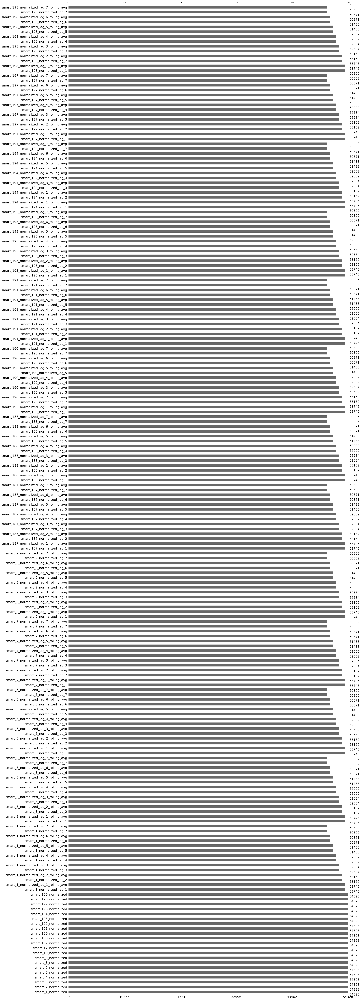

In [ ]:
msno.bar(X_train_num)

In [ ]:
x_train_num = X_train_num.fillna(0)


<Axes: >

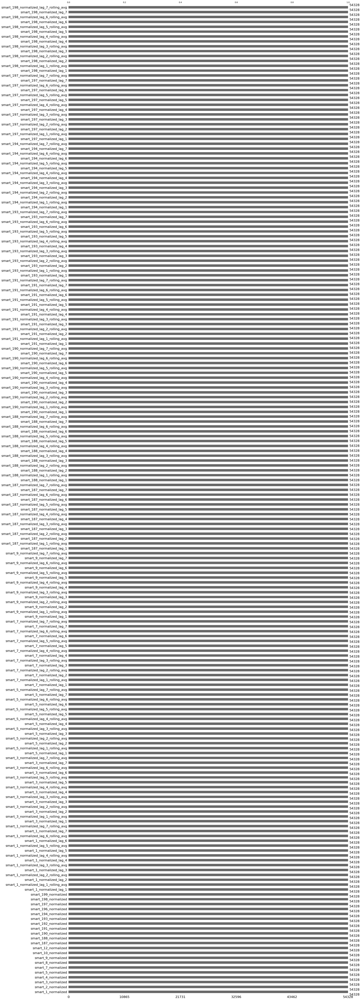

In [ ]:
msno.bar(x_train_num)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 1.6 MB/s eta 0:00:00
Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	203
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	203
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	203
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	203
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	203
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	203
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	203
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	151
Tentative: 	52
Rejected: 	0
Iteration: 	9 / 100
Confirmed: 	151
Tentative: 	52
Rejected: 	0
Iteration: 	10 / 100
Confirmed: 	151
Tentative: 	48
Rejected: 	4
Iteration: 	11 / 100
Confirmed: 	151
Tentative: 	48
Rejected: 	4
Iteration: 	12 / 100
Confirmed: 	161
Tentative: 	38
Rejected: 	4
Iteration: 	13 / 100
Confirmed: 	161
Tentative: 	38
Rejected: 	4
Iteration: 	14 / 100
Confirmed: 	161
Tentative: 	38
Rejected: 	4
Iteration: 	15 / 100
Confi

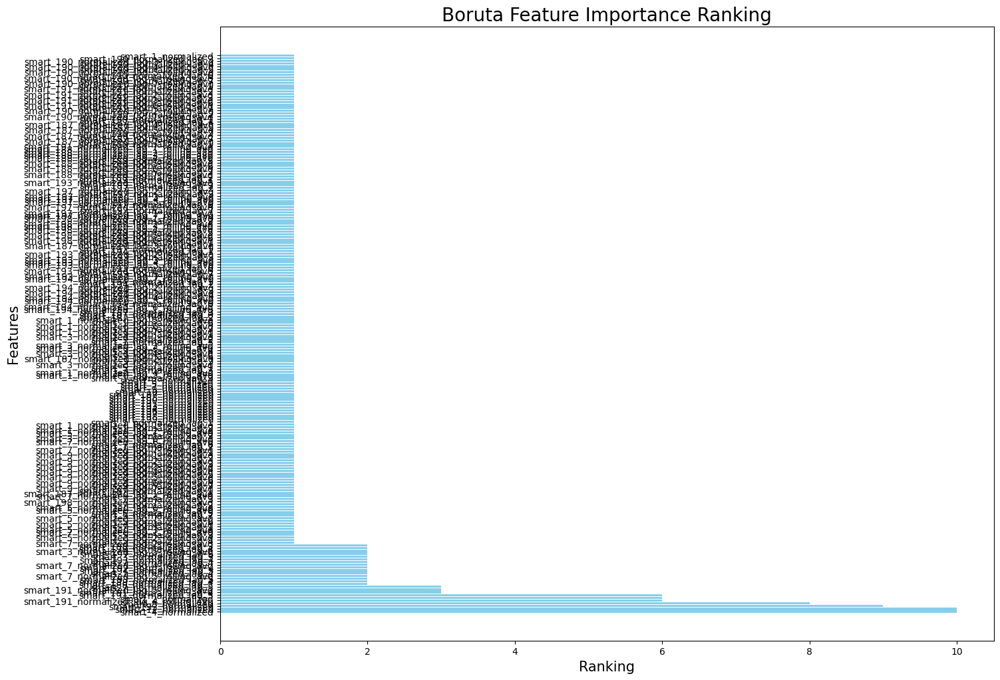

In [ ]:
#Feature Selection

!pip install boruta
from boruta import BorutaPy
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(random_state=1, n_estimators=1000, max_depth=5)
boruta_selector = BorutaPy(rfc, n_estimators='auto', verbose=2, random_state=1)
boruta_selector.fit(np.array(x_train_num), np.array(y_train))

# Ranking of Boruta

print("Ranking: ",boruta_selector.ranking_)
print("No. of significant features: ", boruta_selector.n_features_)

selected_rf_features = pd.DataFrame({'Feature':list(x_train_num.columns),
                                       'Ranking':boruta_selector.ranking_})
selected_rf_features.sort_values(by='Ranking').head(30)

# Sorting features based on ranking
sorted_features = selected_rf_features.sort_values(by='Ranking')

# Plotting the features
plt.figure(figsize=(15, 12))
plt.barh(sorted_features['Feature'], sorted_features['Ranking'], color='skyblue')
plt.xlabel('Ranking', fontsize=15)
plt.ylabel('Features', fontsize=15)
plt.title('Boruta Feature Importance Ranking', fontsize=20)
plt.gca().invert_yaxis()
plt.show()



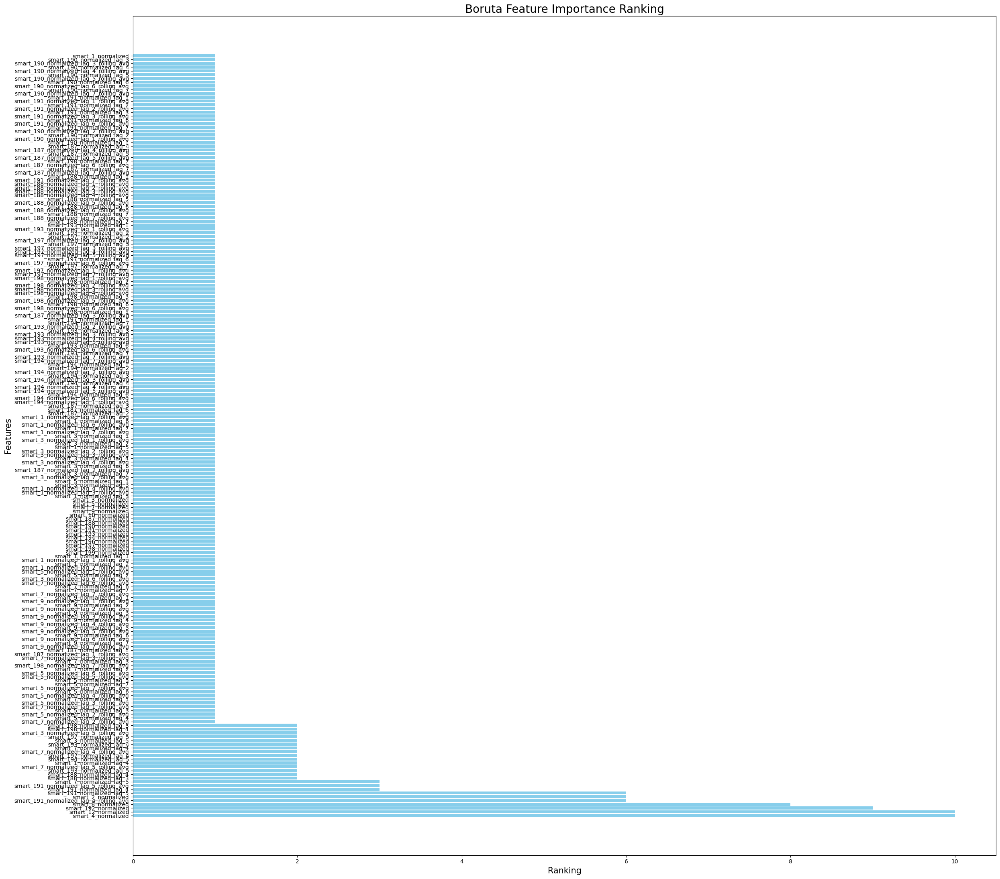

In [ ]:
# Plotting the features
plt.figure(figsize=(25, 22))
plt.barh(sorted_features['Feature'], sorted_features['Ranking'], color='skyblue')
plt.xlabel('Ranking', fontsize=15)
plt.ylabel('Features', fontsize=15)
plt.title('Boruta Feature Importance Ranking', fontsize=20)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [ ]:
X_valid_num = X_valid.drop(columns=['serial_number'])

x_test_num = X_test_num.fillna(0)
x_valid_num = X_valid_num.fillna(0)

In [ ]:
# Using the BorutaPy object to transform the features in the dataset.

accepted = x_train_num.columns[boruta_selector.support_].to_list()

undecided = x_train_num.columns[boruta_selector.support_weak_].to_list()

selected_features = accepted + undecided

X_Filtered_train = x_train_num[selected_features]
X_Filtered_test =  x_test_num[selected_features]
X_Filtered_valid = x_valid_num[selected_features]

In [ ]:
print(selected_features)

['smart_1_normalized', 'smart_3_normalized', 'smart_5_normalized', 'smart_7_normalized', 'smart_9_normalized', 'smart_10_normalized', 'smart_187_normalized', 'smart_188_normalized', 'smart_190_normalized', 'smart_191_normalized', 'smart_193_normalized', 'smart_194_normalized', 'smart_196_normalized', 'smart_197_normalized', 'smart_198_normalized', 'smart_199_normalized', 'smart_1_normalized_lag_1', 'smart_1_normalized_lag_1_rolling_avg', 'smart_1_normalized_lag_2', 'smart_1_normalized_lag_2_rolling_avg', 'smart_1_normalized_lag_3', 'smart_1_normalized_lag_3_rolling_avg', 'smart_1_normalized_lag_4_rolling_avg', 'smart_1_normalized_lag_5', 'smart_1_normalized_lag_5_rolling_avg', 'smart_1_normalized_lag_6', 'smart_1_normalized_lag_6_rolling_avg', 'smart_1_normalized_lag_7', 'smart_1_normalized_lag_7_rolling_avg', 'smart_3_normalized_lag_1', 'smart_3_normalized_lag_1_rolling_avg', 'smart_3_normalized_lag_2', 'smart_3_normalized_lag_2_rolling_avg', 'smart_3_normalized_lag_3', 'smart_3_norma

In [ ]:
X_Filtered_train.head()

,smart_1_normalized,smart_3_normalized,smart_5_normalized,smart_7_normalized,smart_9_normalized,smart_10_normalized,smart_187_normalized,smart_188_normalized,smart_190_normalized,smart_191_normalized,...,smart_7_normalized_lag_5_rolling_avg,smart_188_normalized_lag_3,smart_188_normalized_lag_4,smart_193_normalized_lag_4,smart_193_normalized_lag_5,smart_194_normalized_lag_5,smart_197_normalized_lag_4,smart_197_normalized_lag_5,smart_198_normalized_lag_3,smart_198_normalized_lag_4
0,62.0,100.0,100.0,100.0,97.0,100.0,100.0,100.0,52.0,100.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,59.0,100.0,100.0,100.0,97.0,100.0,100.0,100.0,52.0,100.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,70.0,100.0,100.0,100.0,97.0,100.0,100.0,100.0,51.0,100.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,68.0,100.0,100.0,100.0,97.0,100.0,100.0,100.0,51.0,100.0,...,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0
4,71.0,100.0,100.0,100.0,97.0,100.0,100.0,100.0,51.0,100.0,...,0.0,100.0,100.0,100.0,0.0,0.0,100.0,0.0,100.0,100.0


In [ ]:
X_Filtered_train.to_csv(r'/content/drive/MyDrive/X_Filtered_train2.csv', sep='\t', encoding='utf-8',index=True)

In [ ]:
X_Filtered_test.to_csv(r'/content/drive/MyDrive/X_Filtered_test2.csv', sep='\t', encoding='utf-8',index=True)

In [ ]:
X_Filtered_valid.to_csv(r'/content/drive/MyDrive/X_Filtered_valid2.csv', sep='\t', encoding='utf-8',index=True)

In [ ]:
y_train.to_csv(r'/content/drive/MyDrive/y_train2.csv', sep='\t', encoding='utf-8',index=True)

In [ ]:
y_test.to_csv(r'/content/drive/MyDrive/y_test2.csv', sep='\t', encoding='utf-8',index=True)

In [ ]:
y_valid.to_csv(r'/content/drive/MyDrive/y_valid2.csv', sep='\t', encoding='utf-8',index=True)

In [ ]:
#Initial Model Evaluation (Without scaling of features and without addition of  time based features )


Validation Score for LogisticRegression :: 95.63


 LogisticRegression : 

Training Score for LogisticRegression :: 96.16
Testing Score for LogisticRegression :: 94.98
Classification report: 
               precision    recall  f1-score   support

           0       0.97      0.98      0.97     55899
           1       0.50      0.32      0.39      2936

    accuracy                           0.95     58835
   macro avg       0.73      0.65      0.68     58835
weighted avg       0.94      0.95      0.94     58835

Confusion matrix: 
 [[54935   964]
 [ 1989   947]]
ROC AUC: 0.6526511474592679
Sensitivity: 0.3225476839237057
Specificity: 0.98275461099483
Accuracy: 0.9498087872864791
Balanced accuracy: 0.6526511474592678
Type1 Error: 964.0
Type2 Error: 1989.0


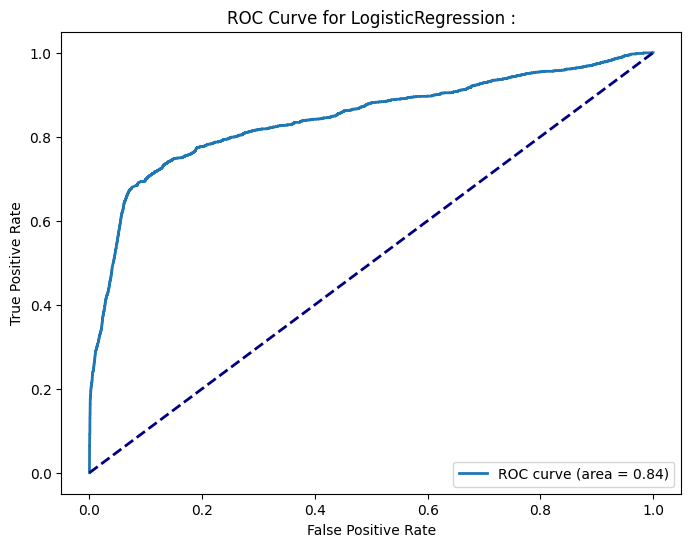


Validation Score for DecisionTree :: 92.08


 DecisionTree : 

Training Score for DecisionTree :: 99.65
Testing Score for DecisionTree :: 91.09
Classification report: 
               precision    recall  f1-score   support

           0       0.97      0.93      0.95     55899
           1       0.27      0.45      0.34      2936

    accuracy                           0.91     58835
   macro avg       0.62      0.69      0.64     58835
weighted avg       0.94      0.91      0.92     58835

Confusion matrix: 
 [[52261  3638]
 [ 1604  1332]]
ROC AUC: 0.6942984044841872
Sensitivity: 0.4536784741144414
Specificity: 0.9349183348539329
Accuracy: 0.9109033738421007
Balanced accuracy: 0.6942984044841871
Type1 Error: 3638.0
Type2 Error: 1604.0


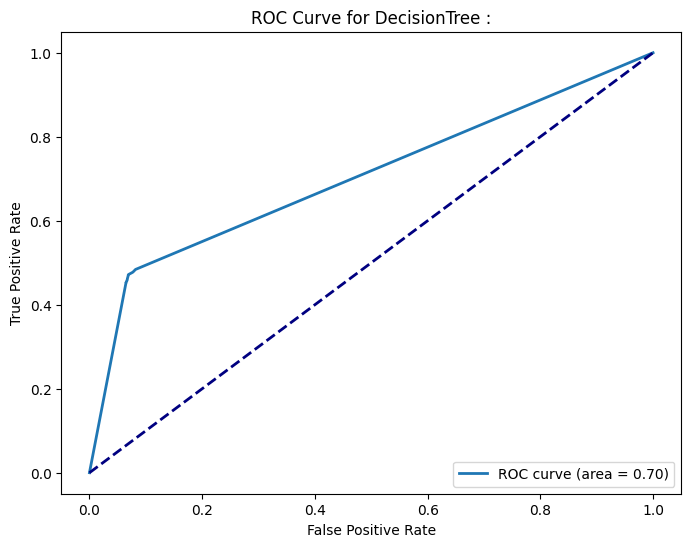


Validation Score for RandomForest :: 95.72


 RandomForest : 

Training Score for RandomForest :: 99.64
Testing Score for RandomForest :: 95.29
Classification report: 
               precision    recall  f1-score   support

           0       0.97      0.98      0.98     55899
           1       0.53      0.43      0.48      2936

    accuracy                           0.95     58835
   macro avg       0.75      0.70      0.73     58835
weighted avg       0.95      0.95      0.95     58835

Confusion matrix: 
 [[54807  1092]
 [ 1681  1255]]
ROC AUC: 0.7039585414439326
Sensitivity: 0.4274523160762943
Specificity: 0.9804647668115709
Accuracy: 0.9528681907028129
Balanced accuracy: 0.7039585414439327
Type1 Error: 1092.0
Type2 Error: 1681.0


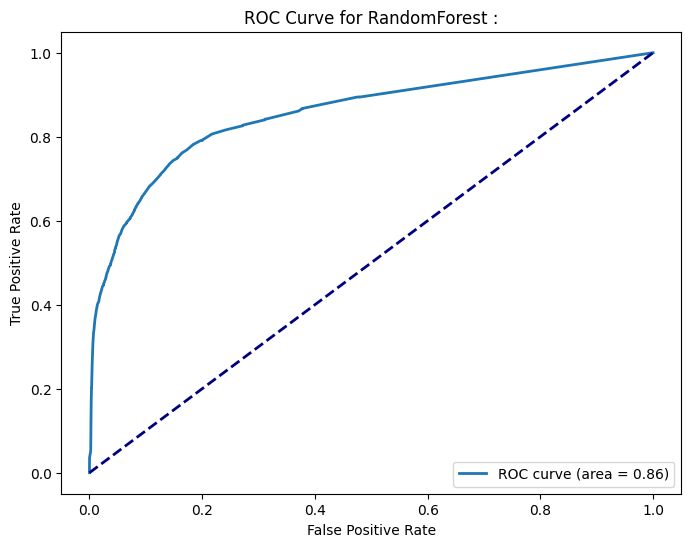


Validation Score for Naive Bayes :: 91.08


 Naive Bayes : 

Training Score for Naive Bayes :: 93.15
Testing Score for Naive Bayes :: 90.88
Classification report: 
               precision    recall  f1-score   support

           0       0.98      0.92      0.95     55899
           1       0.31      0.65      0.42      2936

    accuracy                           0.91     58835
   macro avg       0.64      0.79      0.68     58835
weighted avg       0.95      0.91      0.92     58835

Confusion matrix: 
 [[51558  4341]
 [ 1027  1909]]
ROC AUC: 0.7862732204633571
Sensitivity: 0.6502043596730245
Specificity: 0.9223420812536897
Accuracy: 0.9087617914506672
Balanced accuracy: 0.7862732204633571
Type1 Error: 4341.0
Type2 Error: 1027.0


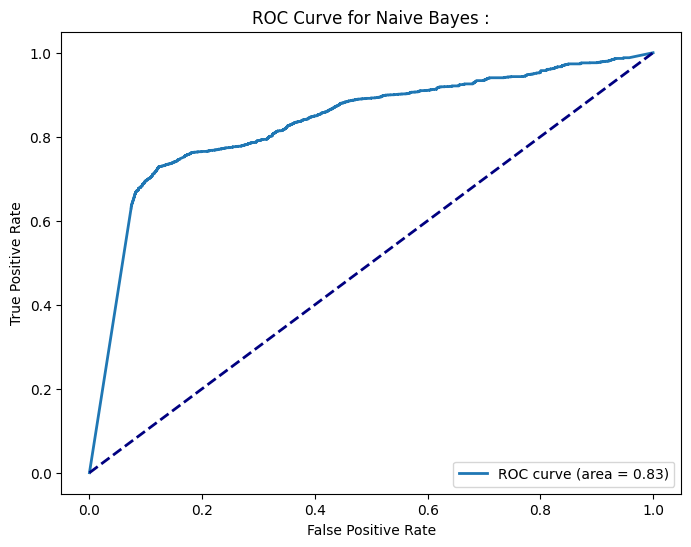


Validation Score for KNeighbours :: 92.33


 KNeighbours : 

Training Score for KNeighbours :: 95.93
Testing Score for KNeighbours :: 93.10
Classification report: 
               precision    recall  f1-score   support

           0       0.97      0.96      0.96     55899
           1       0.33      0.38      0.35      2936

    accuracy                           0.93     58835
   macro avg       0.65      0.67      0.66     58835
weighted avg       0.94      0.93      0.93     58835

Confusion matrix: 
 [[53664  2235]
 [ 1826  1110]]
ROC AUC: 0.6690412844633711
Sensitivity: 0.37806539509536785
Specificity: 0.9600171738313744
Accuracy: 0.9309764595903799
Balanced accuracy: 0.6690412844633711
Type1 Error: 2235.0
Type2 Error: 1826.0


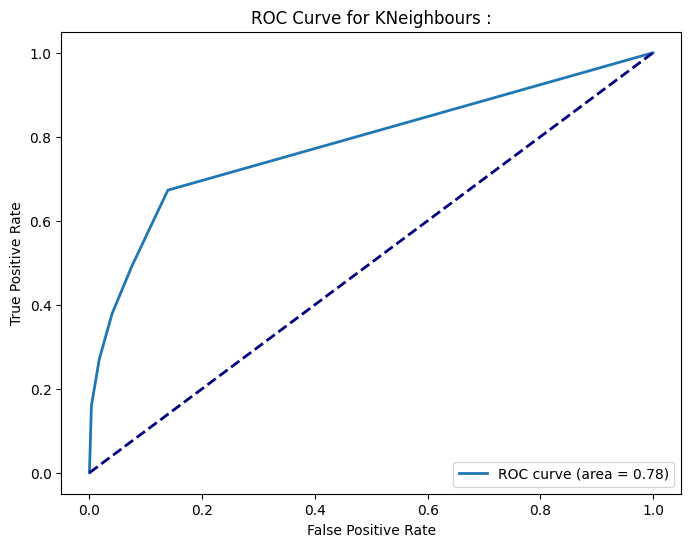


Validation Score for SVM :: 96.05


 SVM : 

Training Score for SVM :: 95.87
Testing Score for SVM :: 95.95
Classification report: 
               precision    recall  f1-score   support

           0       0.96      1.00      0.98     55899
           1       0.91      0.21      0.34      2936

    accuracy                           0.96     58835
   macro avg       0.93      0.60      0.66     58835
weighted avg       0.96      0.96      0.95     58835

Confusion matrix: 
 [[55836    63]
 [ 2321   615]]
ROC AUC: 0.6041708160830942
Sensitivity: 0.20946866485013624
Specificity: 0.9988729673160521
Accuracy: 0.9594799014192232
Balanced accuracy: 0.6041708160830942
Type1 Error: 63.0
Type2 Error: 2321.0


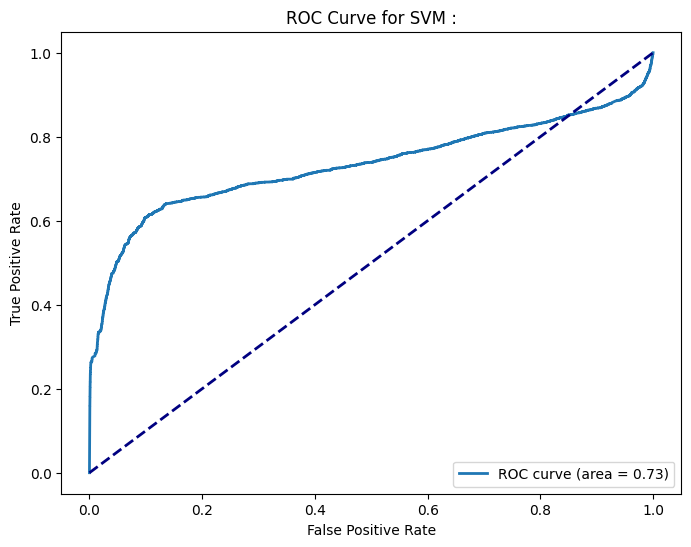

In [ ]:

classifiers = [['LogisticRegression :', LogisticRegression()],
               ['DecisionTree :',DecisionTreeClassifier()],
               ['RandomForest :',RandomForestClassifier()],
               ['Naive Bayes :', GaussianNB()],
               ['KNeighbours :', KNeighborsClassifier()],
               ['SVM :', SVC(probability=True)]]

for name, classifier in classifiers:
    clf = classifier.fit(X_Filtered_train, y_train)

    y_train_pred = clf.predict(X_Filtered_train)
    # Predicting on validation set to tune hyperparameters or make decisions on the model
    y_valid_pred = clf.predict(X_Filtered_valid)
    print(f'\nValidation Score for {name}: {clf.score(X_Filtered_valid, y_valid) * 100:.2f}\n')

    # After validation, performance is tested on the test set
    y_test_pred = clf.predict(X_Filtered_test)
    print(f'\n {name} \n')
    print(f'Training Score for {name}: {clf.score(X_Filtered_train, y_train) * 100:.2f}' )
    print(f'Testing Score for {name}: {clf.score(X_Filtered_test, y_test) * 100:.2f}' )

    print(f'Classification report: \n {classification_report(y_test, y_test_pred)}' )
    print(f'Confusion matrix: \n {confusion_matrix(y_test, y_test_pred)}' )
    print(f'ROC AUC: {roc_auc_score(y_test, y_test_pred)}' )

    tn, fp, fn, tp = confusion_matrix(y_test, y_test_pred).ravel()
    print('Sensitivity:', 1.*tp/(tp+fn))
    print('Specificity:', 1.*tn/(tn+fp))
    print('Accuracy:', 1.*(tp+tn)/(tp+tn+fp+fn))
    print('Balanced accuracy:', 1./2*(1.*tp/(tp+fn) + 1.*tn/(tn+fp)))
    print('Type1 Error:', 1.*fp)
    print('Type2 Error:', 1.*fn)

    y_pred_prob = clf.predict_proba(X_Filtered_test)[:,1]  # probabilities for the positive class
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8,6))
    plt.plot(fpr, tpr, lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {name}')
    plt.legend(loc="lower right")
    plt.show()


In [ ]:
# Assuming you've already calculated these prediction probabilities:
train_probabilities = clf.predict_proba(X_Filtered_train)[:, 1] # Taking the probability of the positive class
test_probabilities = clf.predict_proba(X_Filtered_test)[:, 1]
valid_probabilities = clf.predict_proba(X_Filtered_valid)[:, 1]

# Create new dataframes for prediction probabilities with saved indices
df_train_prob = pd.DataFrame({
    'index': train_indices,
    'probability': train_probabilities
})

df_test_prob = pd.DataFrame({
    'index': test_indices,
    'probability': test_probabilities
})

df_valid_prob = pd.DataFrame({
    'index': valid_indices,
    'probability': valid_probabilities
})

# Merge probabilities back to the original dataframe
df = pd.merge(df, df_train_prob, left_index=True, right_on='index', how='left')
df = pd.merge(df, df_test_prob, left_index=True, right_on='index', how='left')
df = pd.merge(df, df_valid_prob, left_index=True, right_on='index', how='left')

# Combine the probabilities columns into one
df['probability'] = df['probability_x'].combine_first(df['probability_y']).combine_first(df['probability'])
df = df.drop(columns=['probability_x', 'probability_y', 'index'])

# Now select the required columns:
final_output = df[["date", "failure", "serial_number", "TARGET", "GROUP", "probability", "FAILURE_DATE"]]



In [ ]:
final_output.head()

,date,failure,serial_number,TARGET,GROUP,probability,FAILURE_DATE
NaN,2022-03-20,1,11W0A06FF97G,1,TESTING,NaN,2022-03-20
NaN,2022-03-17,0,11W0A06FF97G,1,TESTING,NaN,2022-03-20
NaN,2022-03-18,0,11W0A06FF97G,1,TESTING,NaN,2022-03-20
NaN,2022-03-08,0,11W0A06FF97G,0,TESTING,NaN,2022-03-20
NaN,2022-03-19,0,11W0A06FF97G,1,TESTING,NaN,2022-03-20


import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_0, *['failure'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_1, *['TARGET'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plot(df, x_colname, y_colname, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(6 * figscale, 6 * figscale))
  df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha)
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plot(_df_2, *['failure', 'TARGET'], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_3, *['date', 'failure', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_4, *['date', 'TARGET', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_5, *['date', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_6, *['date', 'failure', None], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_7, *['failure'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_8, *['TARGET'], **{})
chart

In [ ]:
# Create empty dataframes to store probabilities
train_probs_df = pd.DataFrame(index=X_Filtered_train.index)
test_probs_df = pd.DataFrame(index=X_Filtered_test.index)
valid_probs_df = pd.DataFrame(index=X_Filtered_valid.index)

classifiers = [
    ['LogisticRegression', LogisticRegression()],
    ['DecisionTree', DecisionTreeClassifier()],
    ['RandomForest', RandomForestClassifier()],
    ['NaiveBayes', GaussianNB()],
    ['KNeighbours', KNeighborsClassifier()],
    ['SVM', SVC(probability=True)]
]

for name, classifier in classifiers:
    clf = classifier.fit(X_Filtered_train, y_train)

    # Store probabilities for each classifier
    train_probs_df[name] = clf.predict_proba(X_Filtered_train)[:,1]
    valid_probs_df[name] = clf.predict_proba(X_Filtered_valid)[:,1]
    test_probs_df[name] = clf.predict_proba(X_Filtered_test)[:,1]

    # ... rest of your code ...

# Merge probabilities back to the original dataframe
df = pd.merge(df, train_probs_df, left_index=True, right_index=True, how='left')
df = pd.merge(df, valid_probs_df, left_index=True, right_index=True, how='left')
df = pd.merge(df, test_probs_df, left_index=True, right_index=True, how='left')

# Select the desired columns from the dataframe:
desired_columns = ["date", "failure", "serial_number", "TARGET", "GROUP", "FAILURE_DATE"] + [name for name, _ in classifiers]
final_output = df[desired_columns]

print(final_output.head())


          date  failure serial_number  TARGET     GROUP FAILURE_DATE  \
0.0 2022-03-21        0      ZL23Y3PV       0  TRAINING   2022-04-18   
1.0 2022-03-20        0      ZL23Y3PV       0  TRAINING   2022-04-18   
2.0 2022-02-08        0  69K0A0KYF97G       0  TRAINING   2022-03-26   
3.0 2022-02-07        0  69K0A0KYF97G       0  TRAINING   2022-03-26   
4.0 2022-02-06        0  69K0A0KYF97G       0  TRAINING   2022-03-26   

     LogisticRegression  DecisionTree  RandomForest  NaiveBayes  KNeighbours  \
0.0            0.322831      0.666667      0.647595         1.0          0.8   
1.0            0.335497      0.166667      0.447499         1.0          0.2   
2.0            0.296211      0.200000      0.490481         1.0          0.2   
3.0            0.289513      0.000000      0.351286         1.0          0.0   
4.0            0.345571      0.000000      0.217980         1.0          0.2   

          SVM  
0.0  0.049389  
1.0  0.046727  
2.0  0.044896  
3.0  0.042362  
4.0  0

In [ ]:
# Create empty dataframes to store probabilities
train_probs_df = pd.DataFrame(index=X_Filtered_train.index)
test_probs_df = pd.DataFrame(index=X_Filtered_test.index)
valid_probs_df = pd.DataFrame(index=X_Filtered_valid.index)

classifiers = [
    ['LogisticRegression :', LogisticRegression()],
    ['DecisionTree :',DecisionTreeClassifier()],
    ['RandomForest :',RandomForestClassifier()],
    ['Naive Bayes :', GaussianNB()],
    ['KNeighbours :', KNeighborsClassifier()],
    ['SVM :', SVC(probability=True)]
]

for name, classifier in classifiers:
    clf = classifier.fit(X_Filtered_train, y_train)

    # Store probabilities for each classifier
    train_probs_df[name] = clf.predict_proba(X_Filtered_train)[:,1]
    valid_probs_df[name] = clf.predict_proba(X_Filtered_valid)[:,1]
    test_probs_df[name] = clf.predict_proba(X_Filtered_test)[:,1]

    # ... rest of your code ...

# Merge probabilities back to the original dataframe
df = pd.merge(df, train_probs_df, left_index=True, right_index=True, how='left')
df = pd.merge(df, valid_probs_df, left_index=True, right_index=True, how='left')
df = pd.merge(df, test_probs_df, left_index=True, right_index=True, how='left')


In [ ]:
df.head()

,index_x,Unnamed: 0,date,serial_number,model,capacity_bytes,failure,smart_1_normalized,smart_1_raw,smart_2_normalized,...,RandomForest :_y,Naive Bayes :_y,KNeighbours :_y,SVM :_y,LogisticRegression :,DecisionTree :,RandomForest :,Naive Bayes :,KNeighbours :,SVM :
0.0,870.0,1492,2022-03-21,ZL23Y3PV,ST16000NM001G,16000900661248,0,81.0,114385096.0,NaN,...,0.3475,1.0,0.4,0.033438,0.322831,0.666667,0.644259,1.0,0.8,0.049276
1.0,871.0,1493,2022-03-20,ZL23Y3PV,ST16000NM001G,16000900661248,0,79.0,86128000.0,NaN,...,0.4800,1.0,0.2,0.034663,0.335497,0.166667,0.511643,1.0,0.2,0.046637
2.0,1113.0,1987,2022-02-08,69K0A0KYF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,...,0.5400,1.0,0.2,0.104867,0.296211,0.200000,0.397909,1.0,0.2,0.044820
3.0,1114.0,1988,2022-02-07,69K0A0KYF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,...,0.3400,1.0,0.2,0.042057,0.289513,0.000000,0.268833,1.0,0.0,0.042305
4.0,1115.0,1989,2022-02-06,69K0A0KYF97G,TOSHIBA MG07ACA14TA,14000519643136,0,100.0,0.0,100.0,...,0.2900,1.0,0.2,0.040694,0.345571,0.000000,0.286095,1.0,0.2,0.046587


In [ ]:
df.describe()

,index_x,Unnamed: 0,capacity_bytes,failure,smart_1_normalized,smart_1_raw,smart_2_normalized,smart_2_raw,smart_3_normalized,smart_3_raw,...,RandomForest :_y,Naive Bayes :_y,KNeighbours :_y,SVM :_y,LogisticRegression :,DecisionTree :,RandomForest :,Naive Bayes :,KNeighbours :,SVM :
count,54328.000000,168285.000000,1.682850e+05,168285.000000,167815.000000,1.678150e+05,75335.000000,75335.000000,166556.000000,166556.000000,...,6217.000000,6.217000e+03,6217.000000,6217.000000,6217.000000,6217.000000,6217.000000,6.217000e+03,6217.000000,6217.000000
mean,27163.500000,84142.000000,1.024197e+13,0.004677,93.998945,6.622674e+07,116.802217,42.999867,98.586704,1663.752408,...,0.172564,2.246399e-01,0.167766,0.098894,0.115148,0.164542,0.154893,2.126780e-01,0.145472,0.087300
std,15683.287049,48579.839363,4.471397e+12,0.068226,13.708193,8.002242e+07,24.774357,48.945676,16.192387,3101.022664,...,0.233947,4.170133e-01,0.285498,0.207212,0.222346,0.365106,0.230434,4.086025e-01,0.267536,0.183943
min,0.000000,0.000000,-1.000000e+00,0.000000,32.000000,0.000000e+00,90.000000,0.000000,81.000000,0.000000,...,0.000000,5.057428e-102,0.000000,0.026498,0.000246,0.000000,0.000000,0.000000e+00,0.000000,0.021552
25%,13581.750000,42071.000000,8.001563e+12,0.000000,82.000000,0.000000e+00,100.000000,0.000000,91.000000,0.000000,...,0.010000,3.413655e-85,0.000000,0.037545,0.013596,0.000000,0.000000,5.540206e-86,0.000000,0.037243
50%,27163.500000,84142.000000,1.200014e+13,0.000000,100.000000,1.880767e+07,100.000000,0.000000,97.000000,0.000000,...,0.080000,6.619283e-72,0.000000,0.037972,0.022091,0.000000,0.040000,2.625550e-76,0.000000,0.037778
75%,40745.250000,126213.000000,1.400052e+13,0.000000,100.000000,1.319141e+08,133.000000,96.000000,100.000000,545.000000,...,0.230000,7.003401e-39,0.200000,0.039175,0.068454,0.000000,0.210000,2.806057e-51,0.200000,0.038154
max,54327.000000,168284.000000,1.600090e+13,1.000000,200.000000,3.599952e+08,252.000000,184.000000,253.000000,10390.000000,...,1.000000,1.000000e+00,1.000000,1.000000,0.999998,1.000000,1.000000,1.000000e+00,1.000000,1.000000


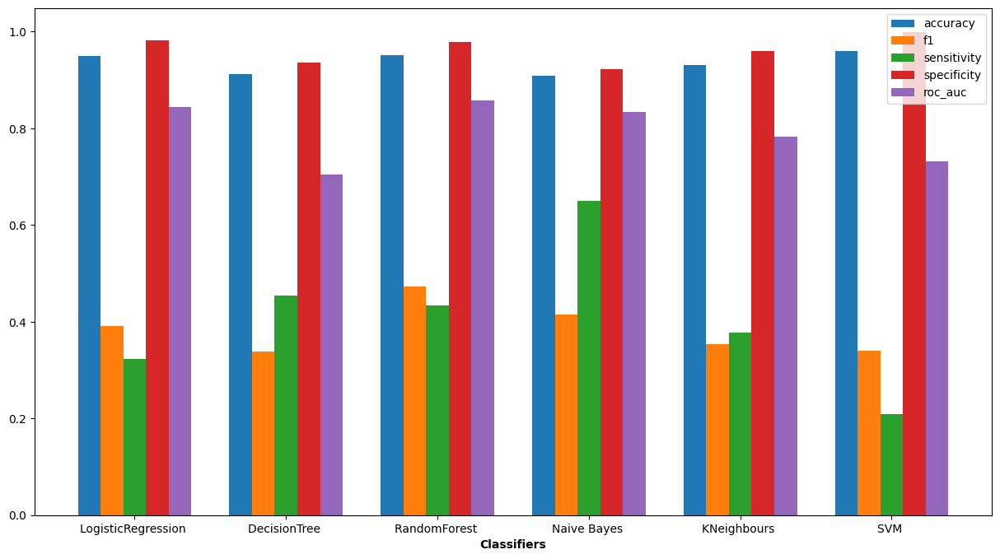

In [ ]:





classifiers = [['LogisticRegression :', LogisticRegression()],
               ['DecisionTree :',DecisionTreeClassifier()],
               ['RandomForest :',RandomForestClassifier()],
               ['Naive Bayes :', GaussianNB()],
               ['KNeighbours :', KNeighborsClassifier()],
               ['SVM :', SVC(probability=True)]]

# Store metrics for each classifier in a dictionary
metrics_data = {
    'accuracy': [],
    'f1': [],
    'sensitivity': [],
    'specificity': [],
    'roc_auc': []
}

classifiers_names = []

for name, classifier in classifiers:
    # Fit the model
    clf = classifier.fit(X_Filtered_train, y_train)
    y_pred = clf.predict(X_Filtered_test)
    y_pred_prob = clf.predict_proba(X_Filtered_test)[:,1]  # probabilities for the positive class

    # Compute metrics
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    f1 = f1_score(y_test, y_pred)
    sensitivity = 1.*tp/(tp+fn)
    specificity = 1.*tn/(tn+fp)
    roc_auc = roc_auc_score(y_test, y_pred_prob)

    # Append metrics to the dictionary
    metrics_data['accuracy'].append(accuracy)
    metrics_data['f1'].append(f1)
    metrics_data['sensitivity'].append(sensitivity)
    metrics_data['specificity'].append(specificity)
    metrics_data['roc_auc'].append(roc_auc)

    classifiers_names.append(name.split(":")[0])  # extract the name of the classifier

# Plotting bar chart
barWidth = 0.15
r = np.arange(len(classifiers_names))
plt.figure(figsize=(15,8))

for i, metric in enumerate(metrics_data.keys()):
    plt.bar([x + i*barWidth for x in r], metrics_data[metric], width=barWidth, label=metric)

plt.xlabel('Classifiers', fontweight='bold')
plt.xticks([r + 2*barWidth for r in range(len(classifiers_names))], classifiers_names)
plt.legend()
plt.show()
